In [1]:
import pandas as pd

df = pd.read_excel('csx_data.xlsx', sheet_name='CSX_index', engine='openpyxl')
df

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
0,19/09/2023,462.38,0.21,461.39,463.22,460.40,77596,668911090,12401483
1,18/09/2023,461.42,0.09,462.53,462.53,459.52,81889,693246670,12375864
2,15/09/2023,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
3,14/09/2023,461.63,0.15,461.59,462.33,459.93,49709,377165210,12381467
4,13/09/2023,462.32,0.37,460.95,464.22,460.06,72530,534518740,12400128
...,...,...,...,...,...,...,...,...,...
2708,25/04/2012,994.62,4.64,994.62,994.62,994.62,35453,327940250,804502
2709,24/04/2012,1043.01,4.90,1043.01,1043.01,1043.01,54735,530929500,843640
2710,23/04/2012,1096.77,0.00,1107.53,1107.53,1096.77,542994,5553099200,887126
2711,20/04/2012,1096.77,4.61,1096.77,1096.77,1096.77,377342,3848888400,887126


In [2]:
data = df.copy()

Rearrange the Date to date format.

In [3]:
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2713 entries, 0 to 2712
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Date                  2713 non-null   datetime64[ns]
 1   Current Index         2713 non-null   float64       
 2   %Change               2713 non-null   float64       
 3   Opening               2713 non-null   float64       
 4   High                  2713 non-null   float64       
 5   Low                   2713 non-null   float64       
 6   Trading Volume (shr)  2713 non-null   int64         
 7   Trading Value (KHR)   2713 non-null   int64         
 8   Market Cap.(Mil.KHR)  2713 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(3)
memory usage: 190.9 KB


In [5]:
data.Date.min(), data.Date.max()

(Timestamp('2012-04-19 00:00:00'), Timestamp('2023-09-19 00:00:00'))

Data are from April 19, 2012 until September 19, 2023. 

Data consists of 2,713 entries.

The columns are Date, Current Index, Percentage of Change, Opening, High, Low, Trading Volume (shr), Trading Value (KHR),  Market Cap.(Mil.KHR)

In [6]:
data.describe()

,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
count,2713.000000,2713.000000,2713.000000,2713.000000,2713.000000,2.713000e+03,2.713000e+03,2.713000e+03
mean,512.365087,0.776351,512.362009,515.103601,509.171139,6.548303e+04,4.929156e+08,3.358590e+06
std,135.754402,1.117344,136.034562,137.054720,134.651620,7.251525e+05,4.411534e+09,3.657548e+06
min,309.010000,0.000000,306.630000,310.710000,304.580000,0.000000e+00,0.000000e+00,4.000770e+05
25%,389.020000,0.090000,388.190000,389.930000,386.640000,2.265000e+03,1.116830e+07,6.704550e+05
50%,493.530000,0.360000,493.510000,495.450000,491.580000,9.979000e+03,5.644750e+07,1.195869e+06
75%,640.660000,0.990000,640.940000,643.500000,637.990000,4.414900e+04,3.262269e+08,7.162944e+06
max,1096.770000,8.570000,1107.530000,1107.530000,1096.770000,3.264843e+07,1.756987e+11,1.482125e+07


### Data Value Over Time

#### a. CSX Index

##### Checking the peak of the index prices values. 

In [7]:
mean = data['Current Index'].mean()
std_dev = data['Current Index'].std()

threshold = 3 * std_dev

outliers = data[(data['Current Index'] < (mean - threshold)) | (data['Current Index'] > (mean + threshold))]

In [8]:
threshold

407.2632071564211

In [9]:
import plotly.express as px
fig = px.line(data, x='Date', y='Current Index')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='CSX Index')
fig.add_scatter(x=outliers['Date'], y=outliers['Current Index'], mode='markers', name='Outliers')
# Add threshold lines
fig.add_scatter(x=data['Date'], y=[mean + threshold] * len(data), mode='lines', name='Upper Threshold')
# fig.add_scatter(x=data['Date'], y=[mean - threshold] * len(data), mode='lines', name='Lower Threshold')
# fig.add_scatter(x=data['Date'], y=[threshold] * len(data), mode='lines', name='Threshold')
fig.show()

In [10]:
outliers

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
2707,2012-04-26,946.24,4.86,946.24,946.24,946.24,3453,30386400,765364
2708,2012-04-25,994.62,4.64,994.62,994.62,994.62,35453,327940250,804502
2709,2012-04-24,1043.01,4.90,1043.01,1043.01,1043.01,54735,530929500,843640
2710,2012-04-23,1096.77,0.00,1107.53,1107.53,1096.77,542994,5553099200,887126
2711,2012-04-20,1096.77,4.61,1096.77,1096.77,1096.77,377342,3848888400,887126
2712,2012-04-19,1048.39,4.84,1048.39,1048.39,1048.39,488528,4763148000,847988


#### B. Trading Volumes

In [11]:
mean_trade_vol= data['Trading Volume (shr)'].mean()
std_dev_trade_vol = data['Trading Volume (shr)'].std()

threshold_trade_vol = 3 * std_dev_trade_vol

outliers_trade_vol = data[(data['Trading Volume (shr)'] < (mean_trade_vol - threshold_trade_vol)) | (data['Trading Volume (shr)'] > (mean_trade_vol + threshold_trade_vol))]

In [12]:
import plotly.express as px
fig = px.line(data, x='Date', y='Trading Volume (shr)')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='Trading Volume (shr)')
fig.add_scatter(x=outliers_trade_vol['Date'], y=outliers_trade_vol['Trading Volume (shr)'], mode='markers', name='Outliers')
fig.add_scatter(x=data['Date'], y=[mean_trade_vol + threshold_trade_vol] * len(data), mode='lines', name='Upper Threshold')
fig.show()

In [13]:
outliers_trade_vol

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
354,2022-04-25,535.76,0.22,534.57,538.57,533.41,15393692,175698710860,8125798
432,2021-12-30,479.54,2.56,478.42,485.60,471.57,32648434,70454941610,7273055
1061,2019-05-21,592.37,1.22,583.81,593.68,582.73,9457422,120124962564,2182002
1090,2019-03-29,580.21,0.08,579.73,582.10,579.73,3004887,6034715820,2137180


##### C. Market Cap

In [14]:
mean_market= data['Market Cap.(Mil.KHR)'].mean()
std_dev_market = data['Market Cap.(Mil.KHR)'].std()

threshold_market = 3 * std_dev_market

outliers_market = data[(data['Market Cap.(Mil.KHR)'] < (mean_market - threshold_market)) | (data['Market Cap.(Mil.KHR)'] > (mean_market + threshold_market))]

In [15]:
fig = px.line(data, x='Date', y='Market Cap.(Mil.KHR)')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='Market Cap.(Mil.KHR)')
fig.add_scatter(x=outliers_market['Date'], y=outliers_market['Market Cap.(Mil.KHR)'], mode='markers', name='Outliers')
fig.add_scatter(x=data['Date'], y=[mean_market + threshold_market] * len(data), mode='lines', name='Upper Threshold')
fig.show()

In [16]:
outliers_market

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
49,2023-07-11,552.59,5.29,548.92,552.61,548.68,679716,2580846970,14821253


##### d. Trading Value (KHR)	

In [17]:
mean_trade_value= data['Trading Value (KHR)'].mean()
std_dev_trade_value = data['Trading Value (KHR)'].std()

threshold_trade_value = 3 * std_dev_trade_value

outliers_trade_value = data[(data['Trading Value (KHR)'] < (mean_trade_value - threshold_trade_value)) | (data['Trading Value (KHR)'] > (mean_trade_value + threshold_trade_value))]


In [18]:
fig = px.line(data, x='Date', y='Trading Value (KHR)')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title='Trading Value (KHR)')
fig.add_scatter(x=outliers_trade_value['Date'], y=outliers_trade_value['Trading Value (KHR)'], mode='markers', name='Outliers')
fig.add_scatter(x=data['Date'], y=[mean_trade_value + threshold_trade_value] * len(data), mode='lines', name='Upper Threshold')
fig.show()

In [19]:
outliers_trade_value

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
354,2022-04-25,535.76,0.22,534.57,538.57,533.41,15393692,175698710860,8125798
432,2021-12-30,479.54,2.56,478.42,485.60,471.57,32648434,70454941610,7273055
617,2021-03-24,640.91,0.05,640.94,642.52,639.69,1634196,18747796910,9720591
812,2020-05-29,826.55,4.15,829.68,852.75,811.09,830244,18442779340,12186373
1061,2019-05-21,592.37,1.22,583.81,593.68,582.73,9457422,120124962564,2182002
1155,2018-12-24,439.32,3.81,456.74,456.74,439.32,2150535,17744662220,1618210


### Check the correlation 

In [20]:
corr = data.corr(method='spearman')
corr

/tmp/ipykernel_1602/432679395.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
Current Index,1.000000,-0.047174,0.998561,0.999162,0.999117,0.246077,0.309450,0.104031
%Change,-0.047174,1.000000,-0.047916,-0.032414,-0.062803,-0.003150,-0.004111,-0.020065
Opening,0.998561,-0.047916,1.000000,0.999123,0.999067,0.246936,0.310434,0.104118
High,0.999162,-0.032414,0.999123,1.000000,0.998377,0.247792,0.311346,0.105712
Low,0.999117,-0.062803,0.999067,0.998377,1.000000,0.243621,0.307058,0.101744
Trading Volume (shr),0.246077,-0.003150,0.246936,0.247792,0.243621,1.000000,0.985938,0.658404
Trading Value (KHR),0.309450,-0.004111,0.310434,0.311346,0.307058,0.985938,1.000000,0.676152
Market Cap.(Mil.KHR),0.104031,-0.020065,0.104118,0.105712,0.101744,0.658404,0.676152,1.000000


In [21]:
corr.style.background_gradient(cmap='coolwarm')

,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
Current Index,1.000000,-0.047174,0.998561,0.999162,0.999117,0.246077,0.309450,0.104031
%Change,-0.047174,1.000000,-0.047916,-0.032414,-0.062803,-0.003150,-0.004111,-0.020065
Opening,0.998561,-0.047916,1.000000,0.999123,0.999067,0.246936,0.310434,0.104118
High,0.999162,-0.032414,0.999123,1.000000,0.998377,0.247792,0.311346,0.105712
Low,0.999117,-0.062803,0.999067,0.998377,1.000000,0.243621,0.307058,0.101744
Trading Volume (shr),0.246077,-0.003150,0.246936,0.247792,0.243621,1.000000,0.985938,0.658404
Trading Value (KHR),0.309450,-0.004111,0.310434,0.311346,0.307058,0.985938,1.000000,0.676152
Market Cap.(Mil.KHR),0.104031,-0.020065,0.104118,0.105712,0.101744,0.658404,0.676152,1.000000


%Change, Trading Volume (shr), Market Cap.(Mil.KHR) will be included in the model to predict the CSX Index.

In [22]:
regressors = ['%Change, Trading Volume (shr), Market Cap.(Mil.KHR)']

### Creating Model

In [23]:
# Remove outliers from CSX Index
data = data.drop(outliers.index)
data

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
0,2023-09-19,462.38,0.21,461.39,463.22,460.40,77596,668911090,12401483
1,2023-09-18,461.42,0.09,462.53,462.53,459.52,81889,693246670,12375864
2,2023-09-15,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
3,2023-09-14,461.63,0.15,461.59,462.33,459.93,49709,377165210,12381467
4,2023-09-13,462.32,0.37,460.95,464.22,460.06,72530,534518740,12400128
...,...,...,...,...,...,...,...,...,...
2702,2012-05-04,741.94,4.83,741.94,741.94,741.94,251705,1736764500,600115
2703,2012-05-03,779.57,4.60,779.57,779.57,779.57,26171,189739750,630555
2704,2012-05-02,817.20,5.00,817.20,817.20,817.20,17097,129937200,660996
2705,2012-04-30,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785


In [24]:
data.set_index('Date', inplace=True)
data

,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
Date,,,,,,,,
2023-09-19,462.38,0.21,461.39,463.22,460.40,77596,668911090,12401483
2023-09-18,461.42,0.09,462.53,462.53,459.52,81889,693246670,12375864
2023-09-15,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
2023-09-14,461.63,0.15,461.59,462.33,459.93,49709,377165210,12381467
2023-09-13,462.32,0.37,460.95,464.22,460.06,72530,534518740,12400128
...,...,...,...,...,...,...,...,...
2012-05-04,741.94,4.83,741.94,741.94,741.94,251705,1736764500,600115
2012-05-03,779.57,4.60,779.57,779.57,779.57,26171,189739750,630555
2012-05-02,817.20,5.00,817.20,817.20,817.20,17097,129937200,660996


In [25]:
data=data.resample('D').fillna(method='ffill') ## The ffill() method replaces the NULL values with the value from the previous row

In [26]:
data

,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
Date,,,,,,,,
2012-04-27,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
2012-04-28,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
2012-04-29,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
2012-04-30,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
2012-05-01,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
...,...,...,...,...,...,...,...,...
2023-09-15,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
2023-09-16,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
2023-09-17,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618


In [27]:
data.reset_index(inplace=True, drop=False)
data

,Date,Current Index,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
0,2012-04-27,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
1,2012-04-28,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
2,2012-04-29,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
3,2012-04-30,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
4,2012-05-01,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
...,...,...,...,...,...,...,...,...,...
4158,2023-09-15,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4159,2023-09-16,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4160,2023-09-17,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4161,2023-09-18,461.42,0.09,462.53,462.53,459.52,81889,693246670,12375864


In [28]:
data.rename(columns={'Date': 'ds', 'Current Index':'y'}, inplace=True)
data

,ds,y,%Change,Opening,High,Low,Trading Volume (shr),Trading Value (KHR),Market Cap.(Mil.KHR)
0,2012-04-27,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
1,2012-04-28,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
2,2012-04-29,903.23,4.55,903.23,903.23,903.23,34877,292966800,730575
3,2012-04-30,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
4,2012-05-01,860.22,4.76,860.22,860.22,860.22,33629,269032000,695785
...,...,...,...,...,...,...,...,...,...
4158,2023-09-15,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4159,2023-09-16,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4160,2023-09-17,461.82,0.04,461.52,461.91,460.65,51639,375381030,12386618
4161,2023-09-18,461.42,0.09,462.53,462.53,459.52,81889,693246670,12375864


In [29]:
data.drop(['Opening', 'High', 'Low', 'Trading Value (KHR)'], axis=1, inplace=True)
data

,ds,y,%Change,Trading Volume (shr),Market Cap.(Mil.KHR)
0,2012-04-27,903.23,4.55,34877,730575
1,2012-04-28,903.23,4.55,34877,730575
2,2012-04-29,903.23,4.55,34877,730575
3,2012-04-30,860.22,4.76,33629,695785
4,2012-05-01,860.22,4.76,33629,695785
...,...,...,...,...,...
4158,2023-09-15,461.82,0.04,51639,12386618
4159,2023-09-16,461.82,0.04,51639,12386618
4160,2023-09-17,461.82,0.04,51639,12386618
4161,2023-09-18,461.42,0.09,81889,12375864


In [30]:
data.rename(columns={'Trading Volume (shr)': 'vol', 'Market Cap.(Mil.KHR)':'Market_cap', '%Change':'per_change'}, inplace=True)
data

,ds,y,per_change,vol,Market_cap
0,2012-04-27,903.23,4.55,34877,730575
1,2012-04-28,903.23,4.55,34877,730575
2,2012-04-29,903.23,4.55,34877,730575
3,2012-04-30,860.22,4.76,33629,695785
4,2012-05-01,860.22,4.76,33629,695785
...,...,...,...,...,...
4158,2023-09-15,461.82,0.04,51639,12386618
4159,2023-09-16,461.82,0.04,51639,12386618
4160,2023-09-17,461.82,0.04,51639,12386618
4161,2023-09-18,461.42,0.09,81889,12375864


In [31]:
regressors = ['per_change', 'vol', 'Market_cap']

In [32]:
# del m

2023-09-24 03:25:38.349478: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-24 03:25:40.327093: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

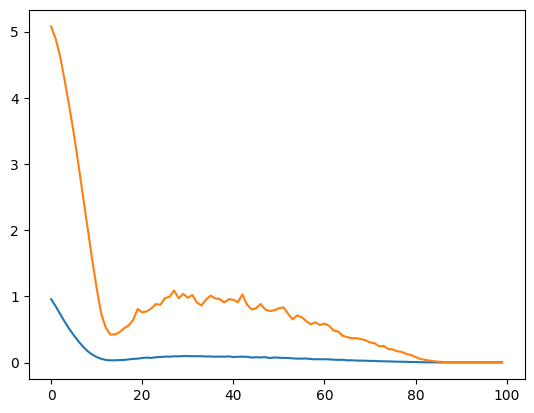

In [33]:
from neuralprophet import NeuralProphet,  set_log_level, set_random_seed
# Disable logging messages unless there is an error
set_log_level("ERROR")
set_random_seed(0)
m = NeuralProphet(
    n_forecasts=60,
    n_lags=60,
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    batch_size=64,
    epochs=100,
    learning_rate=0.01,
)

df_train, df_test = m.split_df(data, freq="D", valid_p=0.2)

m.add_lagged_regressor(regressors)
# metrics = m.fit(data, freq="D")  # fit the model using all data
# with cross-validation
metrics = m.fit(df_train, 
                freq="D",
                validation_df=df_test, # validation proportion of data (20%)
                progress='plot')

In [47]:
metrics.tail(5)

,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
95,42.982391,55.759953,0.007933,0.0,95,22.886124,35.883400,0.002672,0.0
96,43.839020,56.419044,0.008122,0.0,96,22.954241,35.964504,0.002667,0.0
97,43.384937,56.004299,0.008003,0.0,97,22.930777,36.054466,0.002668,0.0
98,43.457478,56.094917,0.008028,0.0,98,22.924646,36.081318,0.002666,0.0
99,43.485550,56.123604,0.008037,0.0,99,22.908501,35.995121,0.002662,0.0


In [36]:
df_test.shape

(916, 5)

In [48]:
future = m.make_future_dataframe(df_train, regressors_df=data[regressors], periods=60, n_historic_predictions=len(df_test))
future

,ds,y,per_change,vol,Market_cap
0,2018-09-14,338.54,4.48,825,1209182
1,2018-09-15,338.54,4.48,825,1209182
2,2018-09-16,338.54,4.48,825,1209182
3,2018-09-17,340.36,0.54,1833,1215690
4,2018-09-18,356.70,4.80,3432,1274049
...,...,...,...,...,...
1031,2021-07-11,NaN,NaN,None,None
1032,2021-07-12,NaN,NaN,None,None
1033,2021-07-13,NaN,NaN,None,None
1034,2021-07-14,NaN,NaN,None,None


In [49]:
forecast = m.predict(future)
forecast

AttributeError: 'NoneType' object has no attribute 'predict'

In [39]:
df_fc = m.get_latest_forecast(forecast)
df_fc

,ds,y,origin-0
0,2021-05-17,NaN,654.274658
1,2021-05-18,NaN,661.415466
2,2021-05-19,NaN,656.257690
3,2021-05-20,NaN,663.967285
4,2021-05-21,NaN,654.294800
5,2021-05-22,NaN,662.954834
6,2021-05-23,NaN,661.710999
7,2021-05-24,NaN,664.702271
8,2021-05-25,NaN,660.792786
9,2021-05-26,NaN,664.919067


In [40]:
filtered_data = data.loc[(data['ds'] >= '2021-05-17') & (data['ds'] <= '2021-07-15')]
filtered_data.reset_index(inplace=True, drop=True)
filtered_data

,ds,y,per_change,vol,Market_cap
0,2021-05-17,655.77,0.07,96943,9945974
1,2021-05-18,652.70,0.47,130834,9899372
2,2021-05-19,652.80,0.02,82388,9900944
3,2021-05-20,654.63,0.28,94595,9928723
4,2021-05-21,655.01,0.06,122030,9934437
5,2021-05-22,655.01,0.06,122030,9934437
6,2021-05-23,655.01,0.06,122030,9934437
7,2021-05-24,650.13,0.75,229456,9860393
8,2021-05-25,650.26,0.02,135912,9862354
9,2021-05-26,649.56,0.11,42469,9851737


In [41]:
df_fc['y'] = filtered_data['y']
df_fc

,ds,y,origin-0
0,2021-05-17,655.77,654.274658
1,2021-05-18,652.70,661.415466
2,2021-05-19,652.80,656.257690
3,2021-05-20,654.63,663.967285
4,2021-05-21,655.01,654.294800
5,2021-05-22,655.01,662.954834
6,2021-05-23,655.01,661.710999
7,2021-05-24,650.13,664.702271
8,2021-05-25,650.26,660.792786
9,2021-05-26,649.56,664.919067


In [42]:
fig = m.plot(forecast)
fig.show()

In [43]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(df_fc['y'], df_fc['origin-0'], squared=False)
mae = mean_absolute_error(df_fc['y'], df_fc['origin-0'])
r2 = r2_score(df_fc['y'], df_fc['origin-0'])

print('RMSE: ', mse)
print('MAE: ', mae)
print('R2: ', r2)

RMSE:  82.53342326278195
MAE:  63.50999625651041
R2:  -1.5351615775849323


In [44]:
validation = m.predict(df_test)
# validation

Predicting: 50it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /home/hadoop/anaconda3/envs/streamlit_env/lib/python3.10/site-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /home/hadoop/anaconda3/envs/streamlit_env/lib/python3.10/site-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /home/hadoop/anaconda3/envs/streamlit_env/lib/python3.10/site-packages/neuralprophet/data/process.py:127: Perfo

In [51]:
m.plot(validation)


FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': 'yhat1',
              'type': 'scatter',
              'uid': '72787d2c-0182-4ef1-9242-9cb450bc29f8',
              'x': array([datetime.datetime(2021, 3, 18, 0, 0),
                          datetime.datetime(2021, 3, 19, 0, 0),
                          datetime.datetime(2021, 3, 20, 0, 0), ...,
                          datetime.datetime(2023, 9, 17, 0, 0),
                          datetime.datetime(2023, 9, 18, 0, 0),
                          datetime.datetime(2023, 9, 19, 0, 0)], dtype=object),
              'y': array([         nan,          nan,          nan, ..., 466.13589478,
                          466.01296997, 468.50531006])},
             {'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 0.7714285714285714)', 'width': 2},
              'mode': 'lines',
              'name':

In [2]:
from neuralprophet import save, load
save(m, "model_changepoint.np")

2023-09-24 03:37:15.451747: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-24 03:37:17.076089: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [4]:
m = load("model_changepoint.np")

In [5]:
m.plot_parameters(components=["lagged_regressors"])

FigureWidgetResampler({
    'data': [{'marker': {'color': '#2d92ff'},
              'name': 'Lagged Regressor "per_change"',
              'type': 'bar',
              'uid': '13a46c4c-85d2-44cd-b523-3ba065b6fb2a',
              'x': array([60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43,
                          42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25,
                          24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10,  9,  8,  7,
                           6,  5,  4,  3,  2,  1]),
              'xaxis': 'x',
              'y': array([0.01881393, 0.01268246, 0.01207197, 0.01415197, 0.01558839, 0.01688189,
                          0.01995556, 0.01623842, 0.01890313, 0.02702909, 0.0218173 , 0.01738983,
                          0.01490993, 0.01714755, 0.01445934, 0.01208522, 0.01361234, 0.01611612,
                          0.01278413, 0.01210082, 0.0128392 , 0.0160393 , 0.01374264, 0.01340755,
                   

In [7]:
# m.plot_components(forecast, components=["lagged_regressors"])